# Part3: Understanding Data
For this part, define a SQL query for each of the following questions - one query per question. Save each query as a .sql file, naming it something illustrative of what the query is for, e.g. top_10_hottest_days.sql.



In [28]:
def write_query_to_file(query: str, outfile: str) -> None:
    """
    Write the given SQL query to the specified file.

    Args:
        query (str): The SQL query to write to the file.
        outfile (str): The file path to write the SQL query to.

    Returns:
        None.
    """
    with open(outfile, "w") as f:
        f.write(query)
        

### query1
For 01-2009 through 06-2015, show the popularity of Yellow Taxi rides for each hour of the day. 

The query result should have 24 bins, one for each hour, descending.


In [29]:
# SQL query 1
query1 = """
SELECT strftime('%H', Pickup_Datetime) AS hour_of_day, COUNT(*) AS num_rides
FROM taxi_trips
WHERE Pickup_Datetime BETWEEN '2009-01-01 00:00:00' AND '2015-07-01 00:00:00'
GROUP BY hour_of_day
ORDER BY num_rides DESC
"""


In [30]:
# Execute the SQL query1
engine.execute(query1).fetchall()

[('20', 12455),
 ('19', 12439),
 ('21', 12012),
 ('18', 11781),
 ('22', 11440),
 ('23', 10362),
 ('08', 9927),
 ('09', 9756),
 ('17', 9153),
 ('14', 8754),
 ('12', 8752),
 ('13', 8724),
 ('11', 8611),
 ('10', 8524),
 ('15', 8342),
 ('00', 8081),
 ('07', 7316),
 ('16', 7265),
 ('01', 6007),
 ('02', 4498),
 ('06', 4063),
 ('03', 3008),
 ('04', 2020),
 ('05', 1710)]

In [31]:
# Write the SQL query1 to a file
write_query_to_file(query1, "popularity of Yellow Taxi rides for each hour of the day.sql")

### query 2
For the same time frame, show the popularity of Uber rides for each day of the week.

The result should have 7 bins, one for each day, descending.


In [32]:
# SQL query 2
query2 = """
SELECT day_of_week, COUNT(*) AS num_rides
FROM uber_trips
WHERE Pickup_Datetime BETWEEN '2009-01-01 00:00:00' AND '2015-07-01 00:00:00'
GROUP BY day_of_week
ORDER BY num_rides DESC
"""


In [33]:
# Execute the SQL query2
engine.execute(query2).fetchall()

[(4, 29749),
 (5, 29213),
 (3, 28960),
 (2, 27971),
 (1, 27152),
 (6, 25503),
 (0, 24280)]

In [34]:
# Write the SQL query2 to a file
write_query_to_file(query2, "popularity of Uber rides for each day of the week.sql")

### query 3
What is the 95% percentile of distance traveled for all hired trips during July 2013?

The result should be a float. It’s okay if it’s a single float within a list and/or tuple.


In [35]:
# SQL query 3
query3 = """
WITH all_trips AS (
    SELECT Trip_Distance FROM taxi_trips 
    WHERE Pickup_Datetime >= '2013-07-01 00:00:00' AND Pickup_Datetime < '2013-08-01 00:00:00'
    UNION ALL
    SELECT Trip_Distance FROM uber_trips
    WHERE Pickup_Datetime >= '2013-07-01 00:00:00' AND Pickup_Datetime < '2013-08-01 00:00:00'
),

ordered_trips AS (
    SELECT
        Trip_Distance,
        ROW_NUMBER() OVER (ORDER BY Trip_Distance) AS row_number,
        COUNT(*) OVER () AS total_rows
    FROM
        all_trips
)

SELECT Trip_Distance AS percentile_95
FROM ordered_trips
WHERE row_number = ROUND(0.95 * total_rows);
"""


In [36]:
# Execute the SQL query3
engine.execute(query3).fetchall()

[(10.3,)]

In [37]:
# Write the SQL query3 to a file
write_query_to_file(query3, "95% percentile of distance traveled for all hired trips during July 2013.sql")

### query 4
What were the top 10 days with the highest number of hired rides for 2009, and what was the average distance for each day?

The result should be a list of 10 tuples. Each tuple should have three items: a date, an integer for the number of rides of that date, and a float for the average distance of that date. The list of tuples should be sorted by total number of rides, descending.


In [38]:
# SQL query 4
query4="""
SELECT 
  DATE(Pickup_Datetime) AS date, 
  COUNT(*) AS number, 
  AVG(Trip_Distance) AS mean_distance
FROM (
  SELECT Pickup_Datetime, Trip_Distance FROM taxi_trips WHERE STRFTIME('%Y', Pickup_Datetime) = '2009'
  UNION ALL
  SELECT Pickup_Datetime, Trip_Distance FROM uber_trips WHERE STRFTIME('%Y', Pickup_Datetime) = '2009'
) AS all_hired_rides
GROUP BY date
ORDER BY number DESC
LIMIT 10;

"""

In [39]:
# Execute the SQL query4
engine.execute(query4).fetchall()

[('2009-12-11', 224, 2.859048802353341),
 ('2009-06-04', 223, 3.107903752724232),
 ('2009-12-16', 216, 3.2148993092168783),
 ('2009-08-14', 216, 3.55943547110239),
 ('2009-10-23', 213, 2.7293809998657945),
 ('2009-07-23', 213, 3.4472570651607715),
 ('2009-12-10', 212, 3.136934647037549),
 ('2009-04-30', 212, 3.381711342057758),
 ('2009-09-11', 210, 2.684107938135738),
 ('2009-01-27', 210, 3.006270958484008)]

In [40]:
# Write the SQL query4 to a file
write_query_to_file(query4, "top 10 days with the highest number of hired rides for 2009.sql")

### query 5
Which 10 days in 2014 were the windiest on average, and how many hired trips were made on those days?

The result should be a list of 10 tuples. Each tuple should have three items: a date, a float for the average wind speed of that day, and the number of hired trips for that day. The list of tuples should be sorted by the average wind speed, descending.


In [41]:
# SQL query 5
query5="""
WITH all_hired_rides AS (
SELECT Pickup_Datetime FROM taxi_trips
WHERE strftime ('%Y', Pickup_Datetime)='2014'
UNION ALL
SELECT Pickup_Datetime FROM uber_trips
WHERE strftime ('%Y', Pickup_Datetime)='2014')

SELECT date(all_hired_rides.Pickup_Datetime) AS date, COUNT(*) AS number_of_rides, daily_weather.DailyWindSpeed AS avg_wind_speed
FROM all_hired_rides
JOIN daily_weather ON date(all_hired_rides.Pickup_Datetime) = daily_weather.DATE
GROUP BY date
ORDER BY avg_wind_speed DESC
LIMIT 10;
"""

In [42]:
# Execute the SQL query5
engine.execute(query5).fetchall()

[('2014-03-13', 189, 13.541666666666666),
 ('2014-01-07', 168, 13.083333333333334),
 ('2014-01-02', 117, 12.125),
 ('2014-02-13', 122, 12.083333333333334),
 ('2014-12-07', 175, 11.708333333333334),
 ('2014-12-08', 164, 11.5),
 ('2014-03-26', 202, 10.958333333333334),
 ('2014-12-09', 177, 10.416666666666666),
 ('2014-03-29', 196, 10.416666666666666),
 ('2014-03-30', 158, 10.083333333333334)]

In [43]:
# Write the SQL query5 to a file
write_query_to_file(query5, "top 10 days with windiest on average in 2014.sql")

### query6
During Hurricane Sandy in NYC (Oct 29-30, 2012), plus the week leading up and the week after, how many trips were taken each hour, and for each hour, how much precipitation did NYC receive and what was the sustained wind speed? 

The result should be a list of roughly 384 tuples, where each tuple is an entry for every single hour of the given date range, even if no rides were taken, no precipitation was measured, or there was no wind. Each tuple should have four items: a string for the date and hour, an int for the number of hired rides in that hour, the float for the total precipitation for that hour, and a float for the average wind speed for that hour. The list of tuples should be ordered by date+hour, ascending.


In [44]:
# SQL query 6
query6 = """
WITH all_hired_rides AS (
    SELECT 
       Pickup_Datetime FROM taxi_trips
    WHERE 
       date(Pickup_Datetime) BETWEEN '2012-10-22' AND '2012-11-05'
    UNION ALL
    SELECT 
       Pickup_Datetime FROM uber_trips
    WHERE 
       date(Pickup_Datetime) BETWEEN '2012-10-22' AND '2012-11-05')

    SELECT
       strftime('%Y-%m-%d %H:00:00', hourly_weather.DATE) AS date_hour,
       COUNT(all_hired_rides.Pickup_Datetime) AS num_trips,
       COALESCE(SUM(HourlyPrecipitation), 0) AS HourlyPrecipitation,
       COALESCE(AVG(HourlyWindSpeed), 0) AS HourlyWindSpeed
    FROM
       hourly_weather
    LEFT JOIN 
       all_hired_rides
    ON 
       DATE(all_hired_rides.Pickup_Datetime) = DATE(hourly_weather.DATE)
    AND 
       strftime('%H', all_hired_rides.Pickup_Datetime) = strftime('%H', hourly_weather.DATE)
    WHERE
       hourly_weather.DATE BETWEEN '2012-10-22' AND '2012-11-05'
    GROUP BY
       date_hour
    ORDER BY
       date_hour ASC

"""

In [45]:
# Execute the SQL query6
engine.execute(query6).fetchall()

[('2012-10-22 00:00:00', 5, 0.0, 7.0),
 ('2012-10-22 01:00:00', 0, 0.0, 5.0),
 ('2012-10-22 02:00:00', 1, 0.0, 7.0),
 ('2012-10-22 03:00:00', 1, 0.0, 0.0),
 ('2012-10-22 04:00:00', 1, 0.0, 0.0),
 ('2012-10-22 05:00:00', 4, 0.0, 0.0),
 ('2012-10-22 06:00:00', 5, 0.0, 5.0),
 ('2012-10-22 07:00:00', 8, 0.0, 3.0),
 ('2012-10-22 08:00:00', 7, 0.0, 3.0),
 ('2012-10-22 09:00:00', 7, 0.0, 5.0),
 ('2012-10-22 10:00:00', 9, 0.0, 0.0),
 ('2012-10-22 11:00:00', 11, 0.0, 0.0),
 ('2012-10-22 12:00:00', 6, 0.0, 11.0),
 ('2012-10-22 13:00:00', 11, 0.0, 0.0),
 ('2012-10-22 14:00:00', 2, 0.0, 7.0),
 ('2012-10-22 15:00:00', 3, 0.0, 6.0),
 ('2012-10-22 16:00:00', 9, 0.0, 3.0),
 ('2012-10-22 17:00:00', 8, 0.0, 7.0),
 ('2012-10-22 18:00:00', 11, 0.0, 5.0),
 ('2012-10-22 19:00:00', 6, 0.0, 5.0),
 ('2012-10-22 20:00:00', 7, 0.0, 3.0),
 ('2012-10-22 21:00:00', 8, 0.0, 0.0),
 ('2012-10-22 22:00:00', 14, 0.0, 3.0),
 ('2012-10-22 23:00:00', 4, 0.0, 3.0),
 ('2012-10-23 00:00:00', 2, 0.0, 3.0),
 ('2012-10-23 01:00:

In [46]:
# Write the SQL query6 to a file
write_query_to_file(query6, "Hurricane Sandy in NYC.sql")

# Part4: Data Visulization

In [47]:
#import
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import seaborn as sns
from scipy import stats
import numpy as np


## problem 1

### Create an appropriate visualization for the first query/question in part 3.

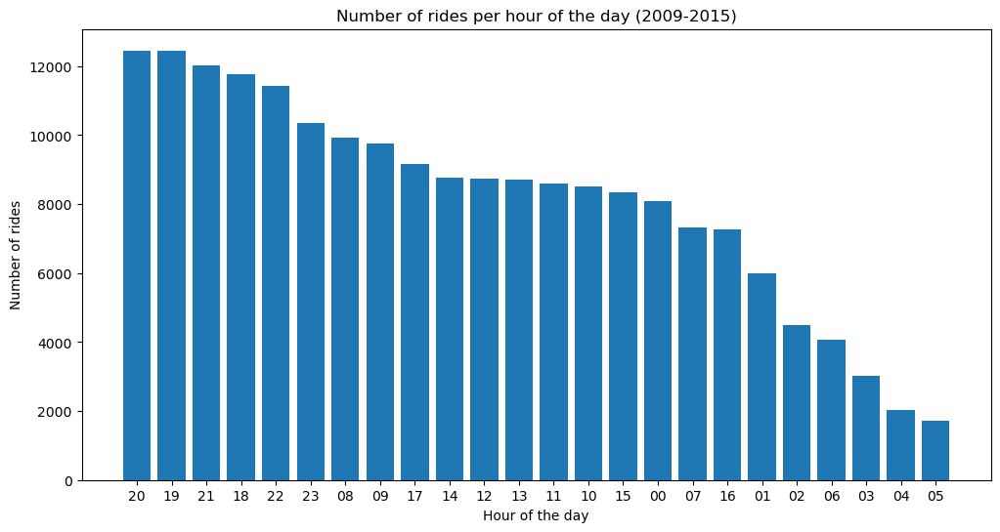

In [48]:
# Execute the SQL query to fetch the number of rides per hour of the day
result1 = engine.execute(query1).fetchall()

# Create a pandas DataFrame from the result
hourly_rides = pd.DataFrame(result1, columns=['hour_of_day', 'num_rides'])

def plot_rides_per_hour(hourly_rides: pd.DataFrame) -> None:
    """
    Plots the number of rides per hour of the day using the input DataFrame.

    :param hourly_rides: A DataFrame containing the hour of the day and the number of rides for each hour.
    """
    plt.figure(figsize=(12, 6))
    plt.bar(hourly_rides['hour_of_day'], hourly_rides['num_rides'])
    plt.xlabel('Hour of the day')
    plt.ylabel('Number of rides')
    plt.title('Number of rides per hour of the day (2009-2015)')
    plt.xticks(range(0, 24))
    plt.show()

# Call the function to render the visualization
plot_rides_per_hour(hourly_rides)


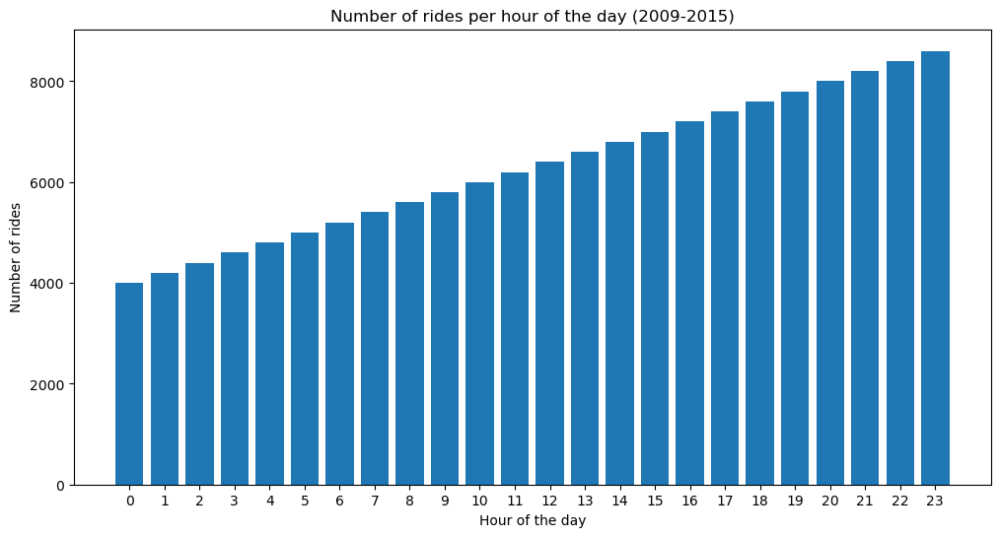

In [49]:
# Sample DataFrame for testing
hourly_rides_data = {
    'hour_of_day': [str(i) for i in range(24)],
    'num_rides': [4000 + i * 200 for i in range(24)]
}

sample_hourly_rides = pd.DataFrame(hourly_rides_data)

# Call the function to render the visualization
plot_rides_per_hour(sample_hourly_rides)

## problem 2

### Create a visualization that shows the average distance traveled per month (regardless of year - so group by each month) for both taxis and Ubers combined. Include the 90% confidence interval around the mean in the visualization.

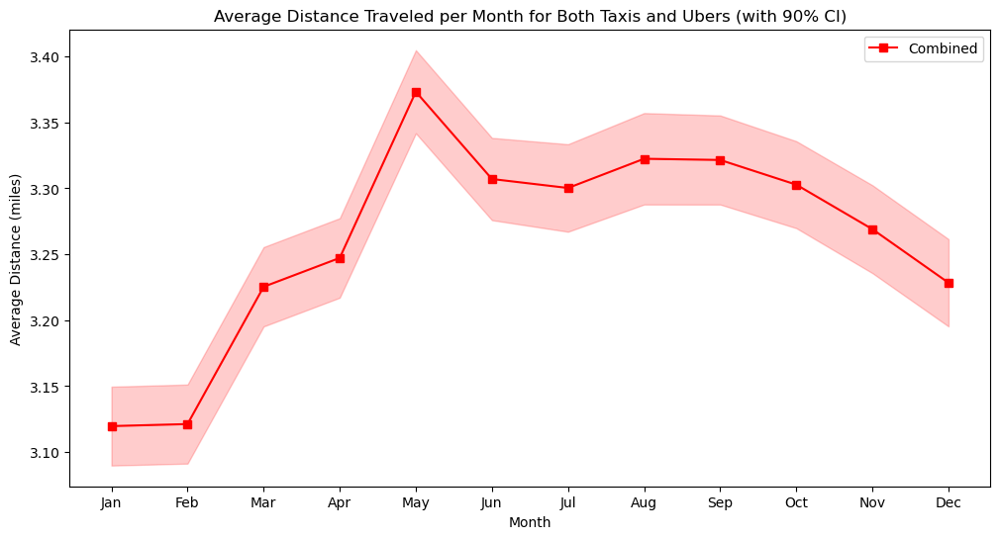

In [63]:
def fetch_monthly_trip_distances(engine) -> pd.DataFrame:
    """
    Fetches monthly trip distances from the taxi_trips and uber_trips tables.

    :param engine: SQLAlchemy engine object.
    :return: A DataFrame containing the trip distances by month.
    """
    # SQL query to fetch the month and trip distance from taxi_trips and uber_trips tables
    query = """
        SELECT
            strftime('%m', Pickup_Datetime) AS month,
            Trip_Distance
        FROM (
            SELECT Pickup_Datetime, Trip_Distance FROM taxi_trips
            UNION ALL
            SELECT Pickup_Datetime, Trip_Distance FROM uber_trips
        );
        """
    return pd.read_sql_query(query, engine)

def plot_avg_trip_distance_with_ci(dataframe: pd.DataFrame, confidence_level: float = 0.9):
    """
    Plots the average trip distance per month with a confidence interval.

    :param dataframe: A DataFrame containing the trip distances by month.
    :param confidence_level: Confidence level for the confidence interval (default is 0.9).
    """
    # Calculate the 90% confidence interval
    z_score = stats.norm.ppf(1 - (1 - confidence_level) / 2)
    monthly_stats = dataframe.groupby('month').agg(['count', 'mean', 'std'])
    monthly_stats['yerr'] = z_score * (monthly_stats[('Trip_Distance', 'std')] / np.sqrt(monthly_stats[('Trip_Distance', 'count')]))

    # Create a line chart using matplotlib
    plt.figure(figsize=(12, 6))
    x = monthly_stats.index.astype(int)
    y = monthly_stats[('Trip_Distance', 'mean')]
    yerr = monthly_stats['yerr']
    plt.plot(x, y, 's-', color='r', label="Combined")
    plt.fill_between(x, y - yerr, y + yerr, color='r', alpha=0.2)
    plt.xlabel('Month')
    plt.ylabel('Average Distance (miles)')
    plt.title('Average Distance Traveled per Month for Both Taxis and Ubers (with 90% CI)')
    plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    plt.legend()
    plt.show()

# Fetch the data and plot the chart
monthly_trip_distances = fetch_monthly_trip_distances(engine)
plot_avg_trip_distance_with_ci(monthly_trip_distances)


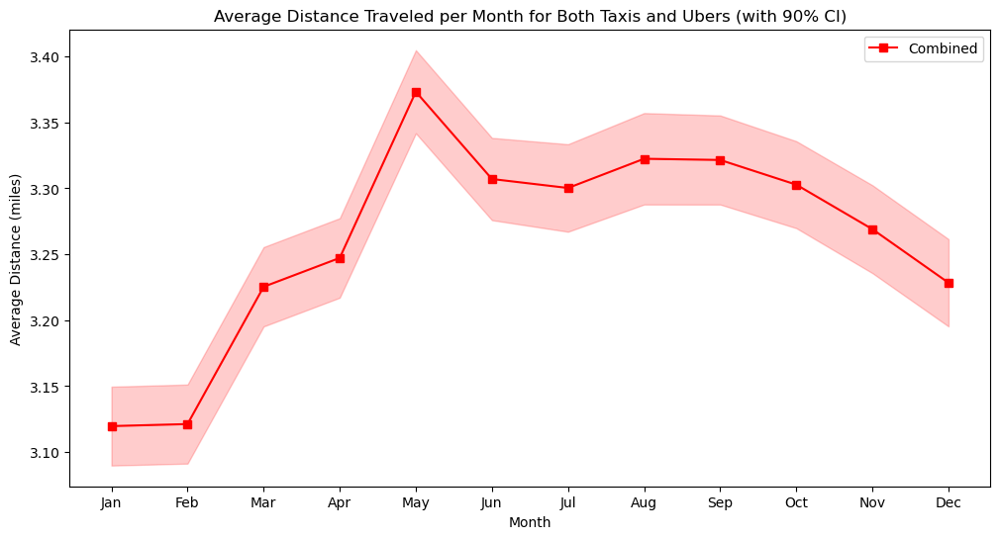

plot_avg_trip_distance_with_ci successfully plotted the chart.


In [64]:
# Test code
def test_fetch_monthly_trip_distances():
    df = fetch_monthly_trip_distances(engine)
    assert isinstance(df, pd.DataFrame), "fetch_monthly_trip_distances should return a DataFrame."
    assert len(df) > 0, "The DataFrame should not be empty."
    assert 'month' in df.columns, "The DataFrame should have a 'month' column."
    assert 'Trip_Distance' in df.columns, "The DataFrame should have a 'Trip_Distance' column."

test_fetch_monthly_trip_distances()

def test_plot_avg_trip_distance_with_ci():
    df = fetch_monthly_trip_distances(engine)
    try:
        plot_avg_trip_distance_with_ci(df)
        print("plot_avg_trip_distance_with_ci successfully plotted the chart.")
    except Exception as e:
        assert False, f"plot_avg_trip_distance_with_ci raised an exception: {e}"

test_plot_avg_trip_distance_with_ci()


# Extra Credit

##  animations and/or widgets for visualizations

<IPython.core.display.Javascript object>


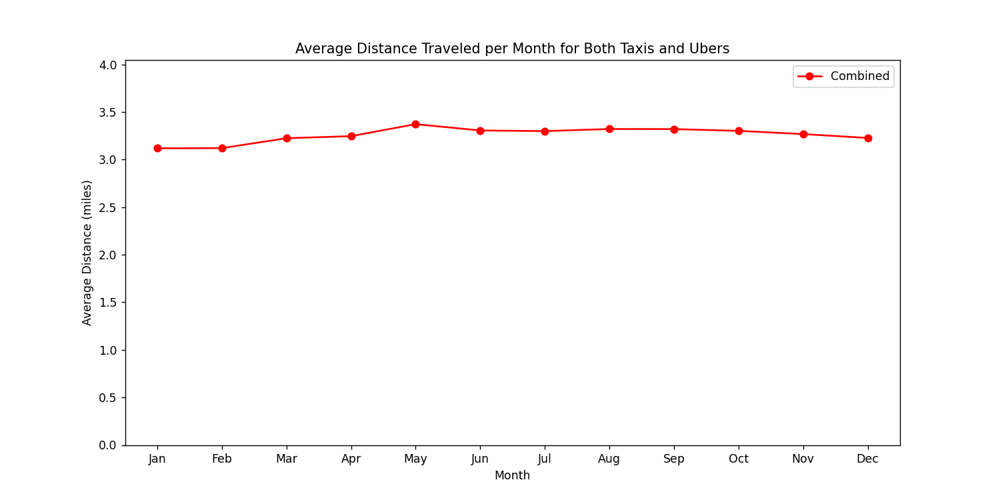

In [75]:
%matplotlib notebook
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.animation import FuncAnimation
from sqlalchemy import create_engine

# Query to obtain the average trip distance for each month
query = """
SELECT
    strftime('%m', Pickup_Datetime) AS month,
    AVG(Trip_Distance) as mean
FROM (
    SELECT Pickup_Datetime, Trip_Distance FROM taxi_trips
    UNION ALL
    SELECT Pickup_Datetime, Trip_Distance FROM uber_trips
)
GROUP BY month
;
"""

# Read the query result into a dataframe
monthly_stats = pd.read_sql_query(query, engine)

def update(month: int) -> None:
    """
    Update the line chart with data up to the given month.

    :param month: The latest month to include in the chart.
    """
    # Clear the current axes
    plt.cla()

    # Get the data up to the given month
    x = monthly_stats['month'].astype(int).iloc[:month]
    y = monthly_stats['mean'].iloc[:month]

    # Plot the data
    plt.plot(x, y, 'o-', color='r', label="Combined")

    # Set axis labels, title, and ticks
    plt.xlabel('Month')
    plt.ylabel('Average Distance (miles)')
    plt.title('Average Distance Traveled per Month for Both Taxis and Ubers')
    plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

    # Set the limits for the x and y axes
    plt.xlim(0.5, 12.5)
    plt.ylim(0, max(monthly_stats['mean']) * 1.2)

    # Add a legend
    plt.legend()

# Create a figure with the specified size
fig = plt.figure(figsize=(12, 6))

# Create an animation that updates the line chart for each month
ani = FuncAnimation(fig, update, frames=range(1, 13), interval=500, repeat=True)

# Show the animation
plt.show()


## problem 3


### Define three lat/long coordinate boxes around the three major New York airports: LGA, JFK, and EWR (you can use bboxfinder to help). Create a visualization that compares what day of the week was most popular for drop offs for each airport. 

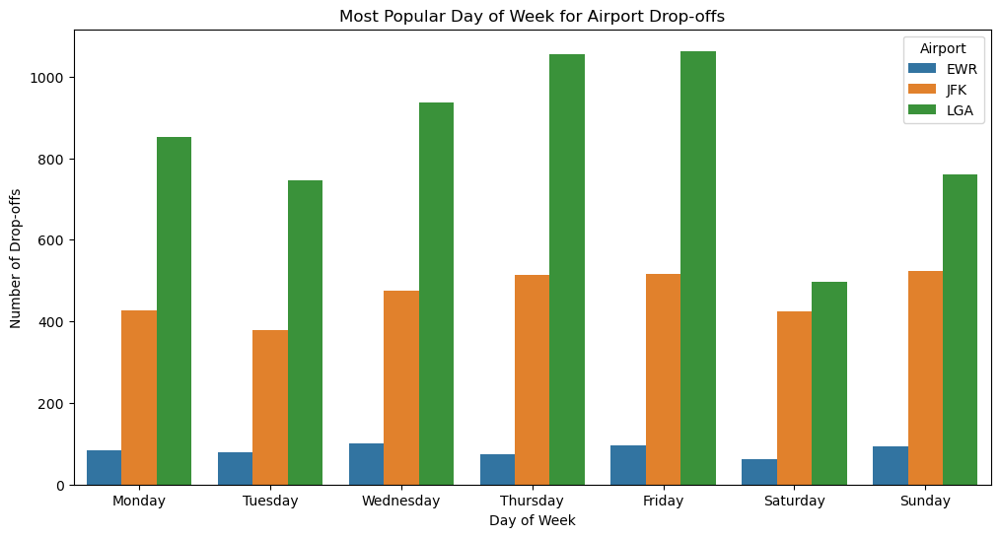

In [50]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sqlalchemy import create_engine

# SQL queries to fetch data from taxi_trips and uber_trips tables
query_taxi = """
SELECT Pickup_Datetime, End_Lat, End_Lon FROM taxi_trips;
"""

query_uber = """
SELECT Pickup_Datetime, End_Lat, End_Lon FROM uber_trips;
"""

# Read the data from the tables
yellow_taxi_data = pd.read_sql_query(query_taxi, engine)
uber_data = pd.read_sql_query(query_uber, engine)

# Define lat/long coordinate boxes around the three major New York airports
LGA_bbox = (40.766531, -73.889617, 40.781155, -73.855117)
JFK_bbox = (40.634320, -73.831170, 40.671924, -73.766694)
EWR_bbox = (40.673381, -74.193284, 40.708890, -74.152928)

def is_within_bbox(lat, lon, bbox):
    """
    Determines if a given latitude and longitude are within the specified bounding box.

    :param lat: Latitude of the point.
    :param lon: Longitude of the point.
    :param bbox: Bounding box in the format (min_lat, min_lon, max_lat, max_lon).
    :return: True if the point is within the bounding box, False otherwise.
    """
    return bbox[0] <= lat <= bbox[2] and bbox[1] <= lon <= bbox[3]

def airport_dropoffs_by_day(data):
    """
    Plots the number of drop-offs by day of the week for each airport.

    :param data: A DataFrame containing the combined trip data.
    """
    # Filter trips by dropoff location
    data['airport'] = 'None'
    data.loc[data.apply(lambda x: is_within_bbox(x['End_Lat'], x['End_Lon'], LGA_bbox), axis=1), 'airport'] = 'LGA'
    data.loc[data.apply(lambda x: is_within_bbox(x['End_Lat'], x['End_Lon'], JFK_bbox), axis=1), 'airport'] = 'JFK'
    data.loc[data.apply(lambda x: is_within_bbox(x['End_Lat'], x['End_Lon'], EWR_bbox), axis=1), 'airport'] = 'EWR'
    
    # Group by airport and day of the week
    airport_day_counts = data[data['airport'] != 'None'].groupby(['airport', 'day_of_week']).size().reset_index(name='count')
    
    # Create a barplot using seaborn
    plt.figure(figsize=(12, 6))
    sns.barplot(x='day_of_week', y='count', hue='airport', data=airport_day_counts)
    plt.xlabel('Day of Week')
    plt.ylabel('Number of Drop-offs')
    plt.title('Most Popular Day of Week for Airport Drop-offs')
    plt.xticks(range(7), ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
    plt.legend(title='Airport')
    plt.show()

# Combine both datasets
combined_trips = pd.concat([yellow_taxi_data, uber_data], ignore_index=True)
combined_trips['Pickup_Datetime'] = pd.to_datetime(combined_trips['Pickup_Datetime'])
combined_trips['day_of_week'] = combined_trips['Pickup_Datetime'].dt.dayofweek

# Call the function to render the visualization
airport_dropoffs_by_day(combined_trips)


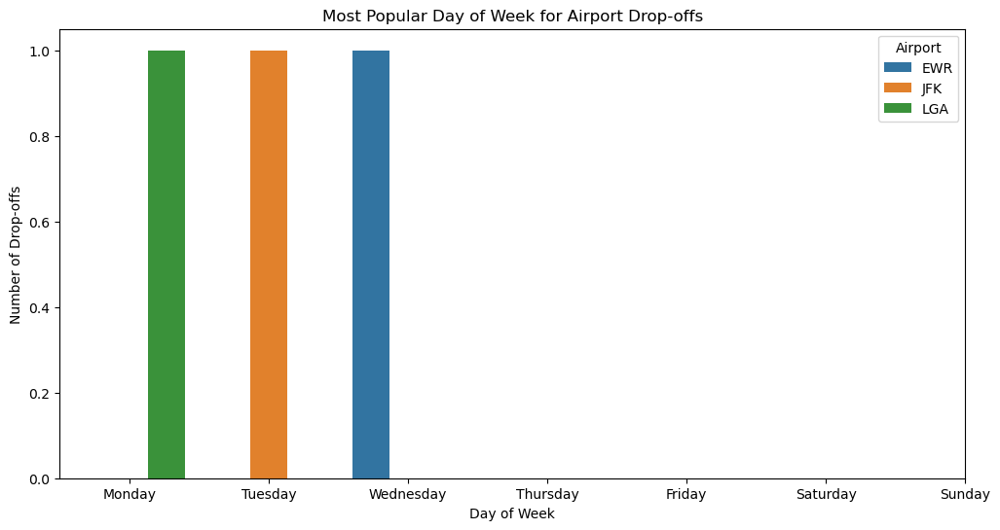

In [51]:
# Test function with a small sample dataset
sample_data = pd.DataFrame({
    'Pickup_Datetime': pd.to_datetime(['2023-04-18 08:00', '2023-04-19 14:00', '2023-04-20 11:00', '2023-04-21 09:00', '2023-04-22 07:00']),
    'End_Lat': [40.774253, 40.644839, 40.677320, 40.689756, 40.710151],
    'End_Lon': [-73.873156, -73.782162, -74.177331, -73.968290, -74.170222]
})

sample_data['day_of_week'] = sample_data['Pickup_Datetime'].dt.dayofweek

# Call the function to render the visualization with sample_data
airport_dropoffs_by_day(sample_data)


## problem 4

### Create a heatmap of all hired trips over a map of the area. Consider using Folium or KeplerGL or another library that helps generate geospatial visualizations. Depending on the library you use, the visualization may not render when viewing on GitHub (after you’ve pushed your code). If that’s the case, please include a screenshot in your repository.


In [52]:
import folium
import pandas as pd
from folium.plugins import HeatMap

def fetch_hired_trip_coordinates(engine) -> pd.DataFrame:
    """
    Fetches start coordinates for both taxi_trips and uber_trips from the database.

    :param engine: SQLAlchemy engine object.
    :return: A DataFrame containing start latitude and longitude for each trip.
    """
    query = """
        SELECT Start_Lat, Start_Lon
        FROM 
           taxi_trips
        UNION ALL
        SELECT 
           Start_Lat, Start_Lon
        FROM 
           uber_trips
        """
    return pd.read_sql_query(query, engine)

def create_heatmap(df: pd.DataFrame) -> folium.Map:
    """
    Creates a heatmap of hired trip start locations using folium.

    :param df: A DataFrame containing start latitude and longitude for each trip.
    :return: A folium.Map object containing the heatmap.
    """
    # Create a base folium map centered on New York City
    map_center = [40.7128, -74.0060]
    m = folium.Map(location=map_center, zoom_start=10)

    # Add a heatmap layer to the map using the start coordinates from the DataFrame
    HeatMap(data=df[['Start_Lat', 'Start_Lon']], radius=8,
            gradient={0.0: 'blue', 0.5: 'green', 1.0: 'red'},
            min_opacity=0.5, max_val=1.0, blur=15).add_to(m)

    return m

# Fetch the data and create the heatmap
hired_trip_coordinates = fetch_hired_trip_coordinates(engine)
heatmap = create_heatmap(hired_trip_coordinates)

# Display the heatmap
heatmap


C:\Users\yuchen\AppData\Local\Temp\ipykernel_36308\2984451626.py:36: UserWarning: The `max_val` parameter is no longer necessary. The largest intensity is calculated automatically.
  HeatMap(data=df[['Start_Lat', 'Start_Lon']], radius=8,


In [53]:
# Test create_heatmap
def test_create_heatmap():
    test_data = pd.DataFrame({'Start_Lat': [40.7128, 40.7158], 'Start_Lon': [-74.0060, -74.0080]})
    heatmap = create_heatmap(test_data)
    assert isinstance(heatmap, folium.Map), "Result should be a folium.Map object"

test_create_heatmap()
print("Test passed!")


Test passed!


C:\Users\yuchen\AppData\Local\Temp\ipykernel_36308\2984451626.py:36: UserWarning: The `max_val` parameter is no longer necessary. The largest intensity is calculated automatically.
  HeatMap(data=df[['Start_Lat', 'Start_Lon']], radius=8,


## Problem 5

### Create a scatter plot that compares tip amount versus distance for Yellow Taxi rides. You may remove any outliers how you see fit.


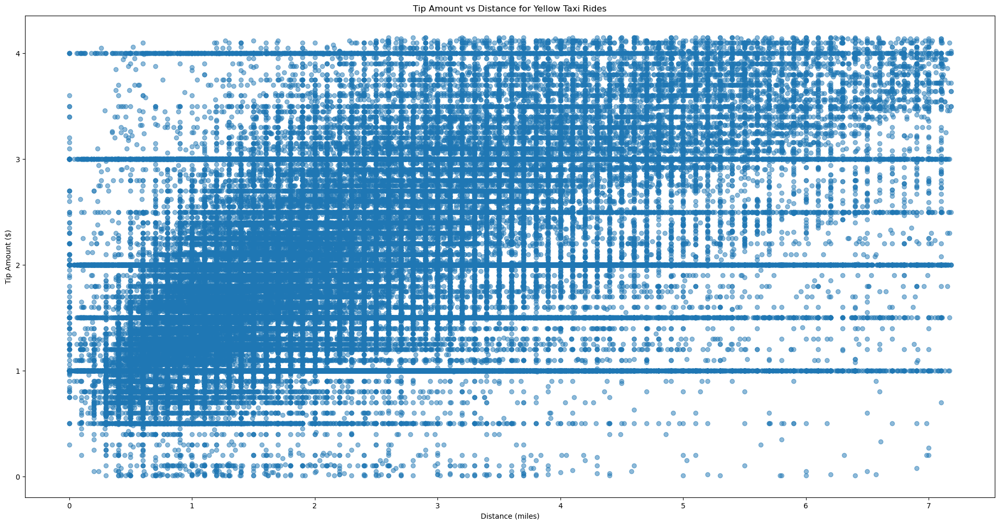

In [54]:
import pandas as pd
import matplotlib.pyplot as plt
from sqlalchemy import create_engine

# Query the taxi_trips table and store the result in a pandas dataframe
query = "SELECT * FROM taxi_trips;"
yellow_taxi_data = pd.read_sql(query, engine)

def remove_outliers(df: pd.DataFrame, column: str) -> pd.DataFrame:
    """
    Removes outliers from a pandas DataFrame based on a specified column.

    :param df: A pandas DataFrame to filter.
    :param column: The name of the column to use for filtering.
    :return: A pandas DataFrame with outliers removed.
    """
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Remove outliers from the Yellow Taxi data
filtered_yellow_taxi_data = remove_outliers(yellow_taxi_data, 'Trip_Distance')
filtered_yellow_taxi_data = remove_outliers(filtered_yellow_taxi_data, 'Tip_Amt')

# Create a scatter plot comparing tip amount versus distance
plt.figure(figsize=(24, 12))
plt.scatter(filtered_yellow_taxi_data['Trip_Distance'], filtered_yellow_taxi_data['Tip_Amt'], alpha=0.5)
plt.xlabel('Distance (miles)')
plt.ylabel('Tip Amount ($)')
plt.title('Tip Amount vs Distance for Yellow Taxi Rides')
plt.show()


In [55]:
# test for the remove_outliers() function
def test_remove_outliers():
    # Create a sample dataframe
    df = pd.DataFrame({'A': [1, 2, 3, 4, 5], 'B': [10, 20, 30, 40, 50]})
    
    # Test removing outliers from column A
    filtered_df = remove_outliers(df, 'A')
    assert len(filtered_df) == 5  # No outliers in column A
    
    # Add an outlier to column A
    df = df.append({'A': 10, 'B': 100}, ignore_index=True)
    
    # Test removing outliers from column A again
    filtered_df = remove_outliers(df, 'A')
    assert len(filtered_df) == 5  # Outlier in column A has been removed
    
    # Test removing outliers from column B
    filtered_df = remove_outliers(df, 'B')
    assert len(filtered_df) == 5  # No outliers in column B


## Problem 6

### Create another scatter plot that compares tip amount versus precipitation amount for Yellow Taxi rides. You may remove any outliers how you see fit.

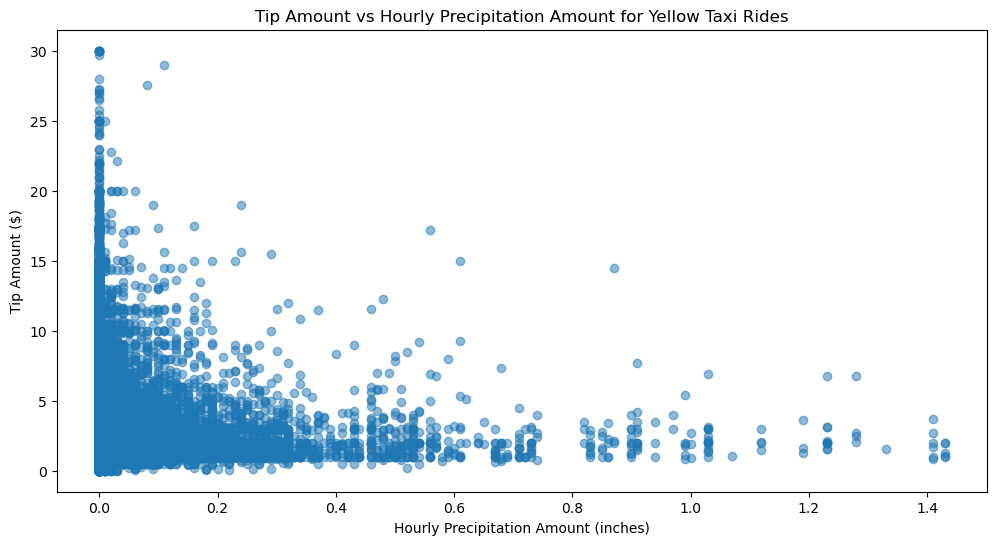

In [56]:
import pandas as pd
import matplotlib.pyplot as plt
from sqlalchemy import create_engine


# Read Yellow Taxi data
yellow_taxi_data = pd.read_sql_table('taxi_trips', engine)

# Read Hourly Weather data
weather = pd.read_sql_table('hourly_weather', engine)

# Convert the DATE column in weather to a pandas datetime object
weather['DATE'] = pd.to_datetime(weather['DATE'])

# Merge Yellow Taxi data with Hourly Weather data based on nearest datetime
merged_data = pd.merge_asof(yellow_taxi_data.sort_values('Pickup_Datetime'), weather.sort_values('DATE'),
                            left_on='Pickup_Datetime', right_on='DATE', direction='nearest')

# Filter outliers based on reasonable ranges for tip amount and precipitation amount
filtered_merged_data = merged_data[(merged_data['Tip_Amt'] >= 0) & (merged_data['Tip_Amt'] <= 30) &
                                   (merged_data['HourlyPrecipitation'] >= 0) & (merged_data['HourlyPrecipitation'] <= 2)]

# Create scatter plot comparing tip amount versus precipitation amount
plt.figure(figsize=(12, 6))
plt.scatter(filtered_merged_data['HourlyPrecipitation'], filtered_merged_data['Tip_Amt'], alpha=0.5)
plt.xlabel('Hourly Precipitation Amount (inches)')
plt.ylabel('Tip Amount ($)')
plt.title('Tip Amount vs Hourly Precipitation Amount for Yellow Taxi Rides')
plt.show()


In [57]:
from sqlalchemy import inspect

inspector = inspect(engine)
table_names = inspector.get_table_names()
print(table_names)

['daily_weather', 'hourly_weather', 'sun_time', 'taxi_trips', 'uber_trips']


# Extra Credit


## Add an additional SQL table that contains daily sunset/sunrise data (which can be found in the original weather data). Write a question that considers this new table in relation to one or more existing tables, and then create either a SQL query or a visualization that answers that question.


## How does the number of taxi trips vary during daylight hours compared to nighttime hours?

In [58]:
import pandas as pd
import glob
from datetime import datetime

# List all the CSV file paths for the years 2009-2015
file_list = []
for year in range(2009, 2016):
    file_list.extend(glob.glob(f"C:\\Users\\yuchen\\Desktop\\tools for analysis\\*{year}*_weather.csv"))

# Read each CSV file into a DataFrame, filter the required columns, and store them in a list
dfs = []
for file in file_list:
    df = pd.read_csv(file)
    df['DATE'] = pd.to_datetime(df['DATE'])
    df_filtered = df[['DATE','Sunrise', 'Sunset']]
    dfs.append(df_filtered)

# Concatenate all the filtered DataFrames together
sun = pd.concat(dfs)

# Convert DATE column to datetime
sun['DATE'] = pd.to_datetime(sun['DATE'])

# Drop rows with missing 'Sunrise' values
sun.dropna(subset=['Sunrise'], inplace=True)

# Round the floating-point numbers and convert them to integers for 'Sunrise' and 'Sunset' columns
sun['Sunrise'] = sun['Sunrise'].apply(lambda x: int(round(float(x))))
sun['Sunset'] = sun['Sunset'].apply(lambda x: int(round(float(x))))

# Convert the integers to zero-padded strings with 4 characters for 'Sunrise' and 'Sunset' columns
sun['Sunrise'] = sun['Sunrise'].apply(lambda x: f"{x:04d}")
sun['Sunset'] = sun['Sunset'].apply(lambda x: f"{x:04d}")

# Convert the 'Sunrise' and 'Sunset' columns to time objects using the appropriate format
sun['Sunrise'] = sun['Sunrise'].apply(lambda x: datetime.strptime(x, "%H%M").time())
sun['Sunset'] = sun['Sunset'].apply(lambda x: datetime.strptime(x, "%H%M").time())




# Keep only rows with minute equal to 51 (might need to adjust this based on your specific requirements)
sun = sun[sun['DATE'].apply(lambda x: x.minute) == 59]

# Reset index
sun.reset_index(drop=True, inplace=True)

C:\Users\yuchen\AppData\Local\Temp\ipykernel_36308\4045811295.py:13: DtypeWarning: Columns (9,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)
C:\Users\yuchen\AppData\Local\Temp\ipykernel_36308\4045811295.py:13: DtypeWarning: Columns (8,9,10,17) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)
C:\Users\yuchen\AppData\Local\Temp\ipykernel_36308\4045811295.py:13: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)
C:\Users\yuchen\AppData\Local\Temp\ipykernel_36308\4045811295.py:13: DtypeWarning: Columns (7,8,9,10,17,18,42,65) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)
C:\Users\yuchen\AppData\Local\Temp\ipykernel_36308\4045811295.py:13: DtypeWarning: Columns (17,78) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(f

In [59]:
sun

,DATE,Sunrise,Sunset
0,2009-01-02 23:59:00,07:20:00,16:40:00
1,2009-01-06 23:59:00,07:20:00,16:44:00
2,2009-01-07 23:59:00,07:20:00,16:45:00
3,2009-01-10 23:59:00,07:20:00,16:48:00
4,2009-01-11 23:59:00,07:20:00,16:49:00
...,...,...,...
1821,2015-12-27 23:59:00,07:19:00,16:35:00
1822,2015-12-28 23:59:00,07:19:00,16:36:00
1823,2015-12-29 23:59:00,07:20:00,16:36:00
1824,2015-12-30 23:59:00,07:20:00,16:37:00


In [60]:
from sqlalchemy import inspect

inspector = inspect(engine)
table_names = inspector.get_table_names()
print(table_names)

['daily_weather', 'hourly_weather', 'sun_time', 'taxi_trips', 'uber_trips']


In [61]:
# Convert the date format to remove the time component
sun['DATE'] = pd.to_datetime(sun['DATE']).dt.date

# Create sun_time table schema
SUN_TIME_SCHEMA = """
CREATE TABLE IF NOT EXISTS sun_time
(
    id INTEGER PRIMARY KEY,
    DATE DATE,
    Sunrise TIME,
    Sunset TIME
)
"""

# Create the sun_time table in the database
with engine.connect() as connection:
    connection.execute(SUN_TIME_SCHEMA)

# Add sun dataframe to the tables_to_df_dict dictionary
tables_to_df_dict['sun_time'] = sun

# Write the dataframes to the tables in the database
write_dataframes_to_table(tables_to_df_dict)


Data successfully written to table hourly_weather.
Data successfully written to table daily_weather.
Data successfully written to table taxi_trips.
Data successfully written to table uber_trips.
Data successfully written to table sun_time.


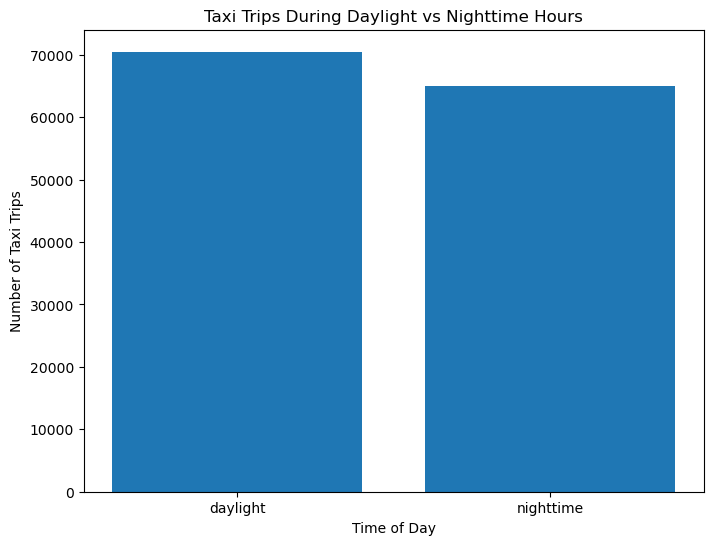

In [62]:
# SQL query to count taxi trips during daytime and nighttime
query = """
WITH daylight AS (
    SELECT
        DATE(Pickup_Datetime) AS date
    FROM taxi_trips t
    JOIN sun_time s ON DATE(t.Pickup_Datetime) = s.DATE
    WHERE TIME(t.Pickup_Datetime) BETWEEN s.Sunrise AND s.Sunset
),
nighttime AS (
    SELECT
        DATE(Pickup_Datetime) AS date
    FROM taxi_trips t
    JOIN sun_time s ON DATE(t.Pickup_Datetime) = s.DATE
    WHERE TIME(t.Pickup_Datetime) NOT BETWEEN s.Sunrise AND s.Sunset
)
SELECT
    'daylight' AS time_of_day,
    COUNT(*) AS trip_count
FROM daylight
UNION ALL
SELECT
    'nighttime' AS time_of_day,
    COUNT(*) AS trip_count
FROM nighttime;
"""

# Execute the query and read the result into a dataframe
trip_counts_by_time_of_day = pd.read_sql_query(query, engine)

# Plot a bar chart comparing the number of taxi trips during daylight and nighttime
plt.figure(figsize=(8, 6))
plt.bar(trip_counts_by_time_of_day['time_of_day'], trip_counts_by_time_of_day['trip_count'])
plt.xlabel('Time of Day')
plt.ylabel('Number of Taxi Trips')
plt.title('Taxi Trips During Daylight vs Nighttime Hours')
plt.show()

